# PA006 - Bank Marketing  Strategy

# Solution Planning ( IOT )

## Imput

 I have been as a Data Scientis Consultant to build a data product that create a customers segmentattion which will handle the marketing strategy and the following expected results from consultancy:
        
        
- 1. Create customer segmentation based on clear selection criteria.
- 2. Make customer segmentation accessible to the operations team.
- 3. Teach the operations team how to use the solution.
- 4. Transfer knowledge to international bank Data Scientists.
- 5. Recommend 3 business levers for each customer segment. 


## Output

- Tools:
    - Jupyter Notebook
    - Metabase
    - Streamlit
    
    
- URL to the Operation team make tests;
- Download of selected data;


# Tasks

- Data Descriptive:
    - NA's replace
    - Outliers Detection
    
    
- EDA:
    - Univariate Analysis
    - Bivariate Analysis
    - Outliers Detection
    - Feature Selection
    - Study of Space
    - Embeding Definition
    
- Machine Learning Training:
    - Performance Analysis
    - Clustering Analysis
    - Define clustering number
    
- EDA - Insights:
    - Expain the segmentattion characters
    


# 0.1 Imports

In [1]:
import inflection
import warnings
import umap


import numpy             as np
import pandas            as pd
import seaborn           as sns
import matplotlib.pyplot as plt



from  sklearn  import  datasets        as dt
from  sklearn  import  cluster         as c
from  sklearn  import  metrics         as m
from  sklearn  import  manifold        as mn
from  sklearn  import  decomposition   as dd
from  sklearn  import  preprocessing   as pp
from  sklearn  import  mixture         as mx
from  sklearn  import  ensemble        as en
from  sklearn  import  model_selection as ms
from  sklearn  import  metrics as mt

from IPython.display             import Image
from bayes_opt                   import BayesianOptimization
from bayes_opt                   import UtilityFunction
from matplotlib                  import gridspec
from sklearn.neighbors           import NearestNeighbors
from pandas_profiling            import ProfileReport
from IPython.core.display        import HTML
from sklearn.datasets            import load_digits


warnings.filterwarnings ('ignore')


# 0.2 Helper functions

In [2]:
def jupyter_settings(): 
    %matplotlib inline 
    #%matplotlib notebook
    %pylab inline
    
    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [25, 12]
    plt.rcParams['font.size'] = 24
    
     
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option ('display.expand_frame_repr', False)
    
    sns.set()

%matplotlib inline 
%matplotlib notebook

plt.style.use('bmh')
plt.rcParams['figure.figsize'] = [25, 12]
plt.rcParams['font.size'] = 24


display( HTML( '<style>.container { width:100% !important; }</style>') )
pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.set_option ('display.expand_frame_repr', False)

sns.set()

jupyter_settings()


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


# 1.0 Data Discriptive

## 1.1 Load dataset

In [3]:
df1 = pd.read_csv( '/Users/adriele/Documents/repos/pa006/dataset/bank.csv')

## 1.2 Rename columns

In [4]:
df1.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

In [5]:
df1.columns = [ 'id', 'balance', 'balance_freq', 'purchases','one_purchases', 'install_purchases', 'cash_adv',
       'purchases_freq', 'one_purchases_freq', 'purchases_install_freq', 'cash_adv_freq',
       'cash_adv_trx', 'purchases_trx', 'credit_limit', 'payments','min_pay', 'prc_full_pay', 'tenure']



# Feature Descriptions


- Id = Unique identification code for each customer.


- Balance = How much I have already spent on my credit card (the invoice)


- Purchases = Amount spent in Catao in the last 6 months (the sum of all amounts when the person swiped the card)


- Purchase One Off = Sum of all purchases paid in 1 installment on the card in the last 6 months.


- Installment Purchases = Sum of all purchases paid in more than 1 installment by credit card in the last 6 months.


- Cash Advance = Amount withdrawn from the credit card limit accumulated over the last 6 months.


- Purchase Frequency = A value of 0 and 1 that identifies the customer's purchasing frequency.


-  Cash Advance Frequency = The frequency with the customer makes money withdrawals from your credit card.


-  Cash Advance TRX = Number of withdrawals from credit card accounts.


-  Purchase TRX = The amount of purchases made on the credit card.


-  Credit Limit = The limit value of the customer's credit card.


- Payments = The amount paid in excess of the minimum invoice (not necessarily the total invoice)

         Ex:
        Total invoice = 300

        minimi payment = 2000

        Actual payment = 2500

        Payment = 500


        Minimum Payment = 2000

        total payment = Payment + Minimum Payment = 2500
        

- Minimum Payments = Minimum amount paid on the invoice.


- Tenure = The length of time the card has been held in months (time during which the person is a bank customer)

## 1.3 Data Dimension

In [6]:
print( 'Number of Cols {}'.format( df1.shape[1] ) )
print( 'Number of Rows {}'.format( df1.shape[0] ) )

Number of Cols 18
Number of Rows 8950


## 1.4 Check NA

In [7]:
df1.isna().sum()

id                          0
balance                     0
balance_freq                0
purchases                   0
one_purchases               0
install_purchases           0
cash_adv                    0
purchases_freq              0
one_purchases_freq          0
purchases_install_freq      0
cash_adv_freq               0
cash_adv_trx                0
purchases_trx               0
credit_limit                1
payments                    0
min_pay                   313
prc_full_pay                0
tenure                      0
dtype: int64

## 1.5 Replace NA

In [8]:
df1['min_pay'] = df1['min_pay'].replace(np.nan, 0)
df1=df1.dropna()


In [9]:
df1.isna().sum()

id                        0
balance                   0
balance_freq              0
purchases                 0
one_purchases             0
install_purchases         0
cash_adv                  0
purchases_freq            0
one_purchases_freq        0
purchases_install_freq    0
cash_adv_freq             0
cash_adv_trx              0
purchases_trx             0
credit_limit              0
payments                  0
min_pay                   0
prc_full_pay              0
tenure                    0
dtype: int64

## 1.6 Data Types

In [10]:
df1.dtypes

id                         object
balance                   float64
balance_freq              float64
purchases                 float64
one_purchases             float64
install_purchases         float64
cash_adv                  float64
purchases_freq            float64
one_purchases_freq        float64
purchases_install_freq    float64
cash_adv_freq             float64
cash_adv_trx                int64
purchases_trx               int64
credit_limit              float64
payments                  float64
min_pay                   float64
prc_full_pay              float64
tenure                      int64
dtype: object

In [11]:
df1['id'] = df1['id'].replace('C', '', regex=True).astype( int)

In [12]:
df1.dtypes

id                          int64
balance                   float64
balance_freq              float64
purchases                 float64
one_purchases             float64
install_purchases         float64
cash_adv                  float64
purchases_freq            float64
one_purchases_freq        float64
purchases_install_freq    float64
cash_adv_freq             float64
cash_adv_trx                int64
purchases_trx               int64
credit_limit              float64
payments                  float64
min_pay                   float64
prc_full_pay              float64
tenure                      int64
dtype: object

# 1.7  Descriptive Startisc

Location Estimate:

    - Mean = Soma of all value divided for the quantity of value.
    - Median = middle value - midpoint value when the dataset is divided into 2 parts.
    - Minimum = The lower value on dataset.
    - Maximum = The big value on dataset.
    
    
Variable Estimate:

    - Deviation = Variable estimete that meansure the values dispersion from dataset around a location estimate (mean).  
    - Standard Deviation = Is the points averange distance around a locatio metric, tha's the mean. + the variance calculete  
    - Variance = Is the calculation of squared deviations by subtracting 1
    - Range
   

## Skewness

- Is the dimersion of a data distribution, copared a normal distribution, and can be: positieve or negative / to right or to left / low or high.
    
        - Close to  0 = Normal distribution;
        - Close to -1 = Negative distribution;
        - Close to +1 = Positive distribution;
        
        - Median > Mean = Tail shifted to the left = Negative skweness;
        10 - 15 = -5
        - Median < Mean = Tail shifted to the right = Positive skweness;
        10 - 8 = 2

## Kurtoses 

- Show the long tails ( the probability of extrame values appear, even its max or min) 

## Quantile

- Any of 3 values that separete a dataset, ordely in 4 equal parts, each part represent 1/4  from origina sample.



    - First Quantile  (bottom) = Is the part of dataset that delimit 25% from dataset;
    - Second Quantile (middle) = Is the part of dataset that delimit 50% from dataset;
    - Third Quantile  ( top )  = Is the part of dataset that delimit 75% from dataset;

## Percentile

- Are the meansures that divide a ordely sample in 100 equal parts.

    - Perc. 01 = 1% from dataset.
    - Perc. 10 = 10% from dataset.
    - Perc. 25 = 25% from dataset => First Quantile.
    - Perc. 50 = 50% from dataset => Second Quantile.
    - Perc. 75 = 75% from dataset => Third Quantile.

In [13]:
num_attributes = df1.select_dtypes( include=['int64', 'float64'] )
cat_attributes = df1.select_dtypes( exclude=[ 'int64', 'float64', 'datetime64[ns]'] )

## 1.7.1 Numerical Atributes

In [14]:
# Central Tendency - mean, Median
ct1 = pd.DataFrame (num_attributes.apply (np.mean) ).T
ct2 = pd.DataFrame (num_attributes.apply (np.median) ).T

# Dispersion - std, min, max, range, skew, kurtosis
d1 = pd.DataFrame (num_attributes.apply (np.std) ).T
d2 = pd.DataFrame (num_attributes.apply (min)).T
d3 = pd.DataFrame (num_attributes.apply (max)).T
d4 = pd.DataFrame (num_attributes.apply (lambda x: x.max () -x.min ()) ).T
d5 = pd.DataFrame (num_attributes.apply (lambda x: x.skew () ) ).T
d6 = pd.DataFrame (num_attributes.apply (lambda x: x.kurtosis ()) ).T

# Concatane
med =pd.concat ([ d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
med.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']


# Percetis
percentis =  num_attributes.apply( lambda x: np.percentile( x, q=[10, 25, 50, 75, 95,99] ) ).T.reset_index()
percentis.columns = ['attributes', 'P10', 'P25', 'P50', 'P75', 'P95', 'P99']

m2 = pd.merge( med, percentis, how='inner', on='attributes')
m2

,attributes,min,max,range,mean,median,std,skew,kurtosis,P10,P25,P50,P75,P95,P99
0,id,10001.0,19190.00000,9189.00000,14599.956978,14598.000000,2651.294053,-0.000735,-1.199430,10925.800000,12307.000000,14598.000000,16900.000000,18732.600000,19100.520000
1,balance,0.0,19043.13856,19043.13856,1564.647593,873.680279,2081.467710,2.393270,7.674046,23.586295,128.365782,873.680279,2054.372848,5909.377888,9338.873258
2,balance_freq,0.0,1.00000,1.00000,0.877350,1.000000,0.236785,-2.024193,3.097607,0.454545,0.888889,1.000000,1.000000,1.000000,1.000000
3,purchases,0.0,49039.57000,49039.57000,1003.316936,361.490000,2136.608461,8.143969,111.379918,0.000000,39.800000,361.490000,1110.170000,3998.764000,8977.910000
4,one_purchases,0.0,40761.25000,40761.25000,592.503572,38.000000,1659.876102,10.044622,164.172057,0.000000,0.000000,38.000000,577.830000,2671.528000,6690.126400
5,install_purchases,0.0,22500.00000,22500.00000,411.113579,89.000000,904.327674,7.298823,96.567168,0.000000,0.000000,89.000000,468.650000,1750.420000,3886.256000
6,cash_adv,0.0,47137.21176,47137.21176,978.959616,0.000000,2097.147163,5.166323,52.894099,0.000000,0.000000,0.000000,1113.868654,4647.894019,9588.329752
7,purchases_freq,0.0,1.00000,1.00000,0.490405,0.500000,0.401337,0.059970,-1.638611,0.000000,0.083333,0.500000,0.916667,1.000000,1.000000
8,one_purchases_freq,0.0,1.00000,1.00000,0.202480,0.083333,0.298328,1.535453,1.161319,0.000000,0.000000,0.083333,0.300000,1.000000,1.000000
9,purchases_install_freq,0.0,1.00000,1.00000,0.364478,0.166667,0.397429,0.509023,-1.398798,0.000000,0.000000,0.166667,0.750000,1.000000,1.000000


- Min_pay = has a skew of 13.62 - Low customers are doing the minimum payment;
- Purchase = 0, mean that there are some custumer that never used the card.
- adv_cash_freq = most of custumers doesn't use the cash adv from card.
- Purchase_trx = show that the most of custumer has lower purchases on card.

In [15]:
## Id = Codigo indentificador unico para cada cliente.

## Balance =  Quanto eu ja gastei no cartao de credito ( a fatura)
## Possiveis Outliers

## Segunda opcao p o Balance = Fatura atual - limite do catao. O quanto falta de limite disponivel p
## Possiveis Outliers.

## Balace Frequency = Frequencia de uso do cartao ( usabilidade )

## Purchases = Valor gasto no catao nos ultimos 6 meses( a soma de todos os valores quando a pessoa passou o cartao )

## Purchase One Off = Soma de todas as compras pagas em 1x no cartao nos ultimos 6 meses.

## Installment Purchases = Soma de todas compras pagas em mais de 1x no cartao de credito nos ultimos 6 meses.
## ( Categoria )

## Cash Advance = Valor do saque do limite do cartao de credito acumulado dos ultimos 6 meses.

## Purchase Frequency =  Um valor de 0 e 1 que indentifica a frequencia de compras do cliente.

## Cash Advance Frequency = A frequencia com o cliente faz retiradas de dinheiro do seu cartao de credito.

## Cash Advance TRX = Quantidade de saques da contas do cartao de credito.

## Purchase TRX =  A quantidade de compras realizadas no cartao de credito.

## Credit Limit = O valor limite do cartao de credito do cliente.

## Payments = O valor pago alem do minimo da fatura ( nao necessariamente a fatura total )
# Ex:
# Fatura total = 300
# pagamento minimi = 2000
# Pagamento efetivo = 2500

#Payment = 500
# Minimum Payment =  2000
# pagamento total = Payment + Minimum Payment = 2500

## Minimum Payments = Valor minimo pago da fatura.

## Tenure =  O tempo de posse do cartao em messes( tempo em que a pessoa e cliente do banco )


<AxesSubplot: xlabel='credit_limit', ylabel='Count'>

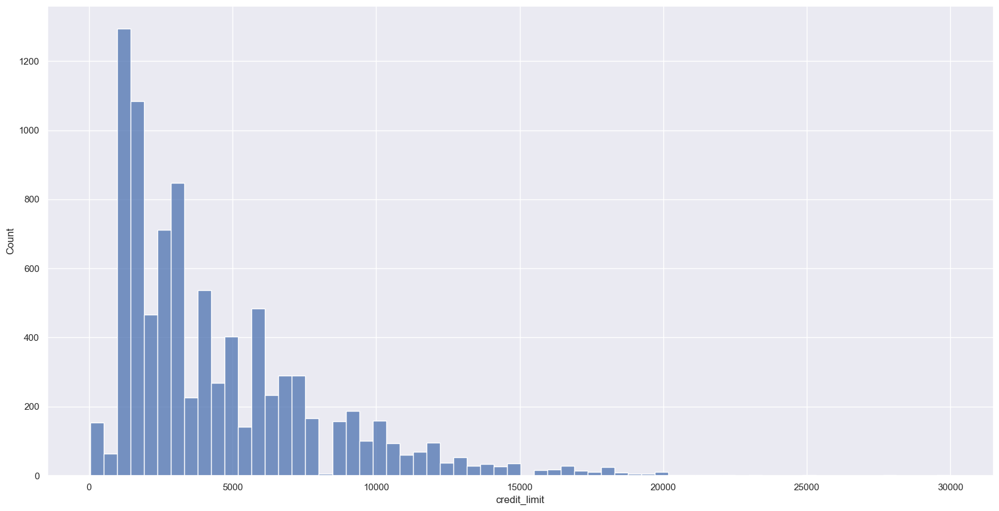

In [16]:
plt.figure( figsize=( 20, 10) )
sns.histplot( x='credit_limit', data=num_attributes )

## Box Plot
- Show the 4 attributes principal of a feature: 
    - center
    - Variability
    - Asymmetry 
    - Outliers.


Attributes:
- Outliers
- Minimum
- Quartile 1
- Quartile 2
- Quartile 3
- Maximun
- Outliers

<AxesSubplot: xlabel='credit_limit'>

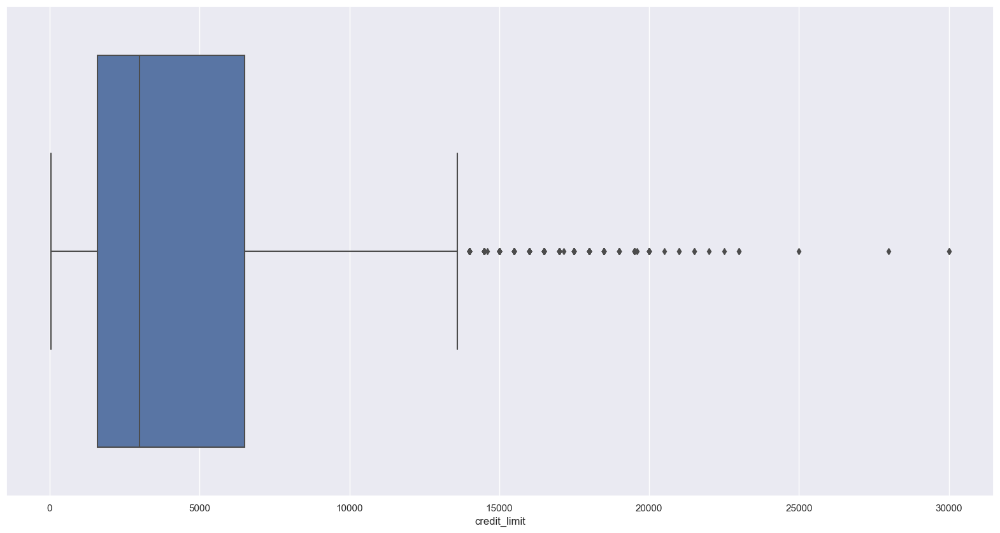

In [17]:
plt.figure( figsize=( 20, 10) )
sns.boxplot( x='credit_limit', data=num_attributes )

In [18]:
np.quantile( num_attributes['credit_limit'], q=[0.25, 0.50, 0.75] )

array([1600., 3000., 6500.])

In [19]:
q1 = 1600
q2 = 3000
q3 = 6500

In [20]:
minq =  q1 - 1.5 * ( q3 - q1)
minq

-5750.0

In [21]:
num_attributes['credit_limit'].min()

50.0

In [22]:
maxq = q3 + 1.5 * ( q3 -q1)
maxq

13850.0

In [23]:
# #calculate real minimum and maximum

# minq =  q1 - 1.5 * ( q3 - q1)
# maxq = q3 + 1.5 * ( q3 -q1)

# if minq < min_value_from_dataset:
#     print( num_attributes[ 'credit_limit' ].min() )
    
# else:
#     print( minq)
    


    
# if maxq > max_value_from_dataset:
#     print( max_value_from_datase) 
    
# else:
#     print( maxq)    


## Violin Plot
- Show the 4 attributes principal of a feature: 
    - Center
    - Variability
    - Asymmetry 
    - Outliers
    - Density.

<AxesSubplot: xlabel='credit_limit'>

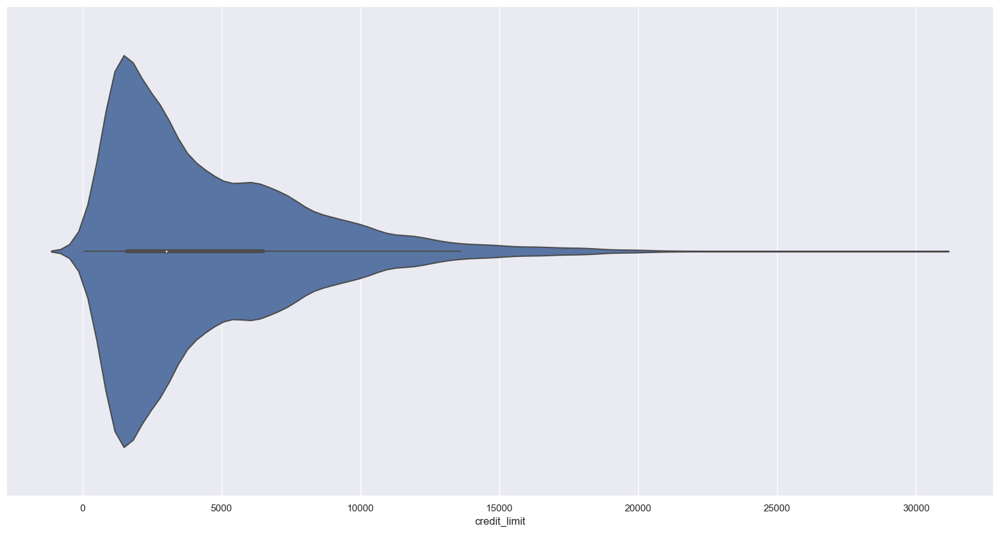

In [24]:
plt.figure( figsize=( 20, 10) )
sns.violinplot( x='credit_limit', data=num_attributes )

# 2.0 Data Filtering

In [25]:
df2 = df1.copy()

# 3.0 Feature Engeneering

In [26]:
df3 = df2.copy()

In [27]:
## Dimensao:

# Tempo ( Ano, mes , dia, hora e minuto )
# Espaco ( localizacao, regiao, lat, log, bairro, rua )
# Produto ( nome, tipo, categoria, preco, condicao de compra )
# Marketing ( organica, paid{ facebook, google})

In [28]:
## Candidate Feature to be Removed ( i don't know the feature has been calculate )
# cash_adv_freq 
# purchases_install_freq 
# tenure

In [29]:
# uni price
#df3.loc[:,'unit_price'] = df3.loc[:, 'purchases'] / df3.loc[:, 'purchases_trx']


# one off payment yes or not  ( pagamento a vista ou nao )
df3['one_payment'] = df3['one_purchases'].apply( lambda x: 0 if x == 0.00 else 1)

# Avg spent by each transaction ( gasto medio por transacao de compra )
#df3['avg_ticket_purchases'] = df3['purchases'] / df3['purchases_trx'] 

# Total Avg spent by each transaction ( gasto medio total por transacao de compra )
#df3['avg_ticket_expenses'] = ( df3['purchases'] + df3['cash_adv'] ) / ( df3['purchases_trx'] + df3['cash_adv'])
# Payment Sum ( soma das despesas /. pagamentos)
#df3['debit_rate'] = ( df3['purchases'] + df3['cash_adv'] ) / ( df3['payments'] + df3['min_pay'])


# # Percentage of card limite use ( )
# df3['credit_limit_rate'] = df3['purchases'] / 6 * df3['credit_limit']
# df3 =df3[~df3.isin([np.nan, np.inf, -np.inf]).any(1)]

df3['gross_revenue'] =  df3['balance'] + df3['cash_adv'] * 0.03
df3 = df3.dropna()


In [30]:
df3.isna().sum()

id                        0
balance                   0
balance_freq              0
purchases                 0
one_purchases             0
install_purchases         0
cash_adv                  0
purchases_freq            0
one_purchases_freq        0
purchases_install_freq    0
cash_adv_freq             0
cash_adv_trx              0
purchases_trx             0
credit_limit              0
payments                  0
min_pay                   0
prc_full_pay              0
tenure                    0
one_payment               0
gross_revenue             0
dtype: int64

In [31]:
df3.head()

,id,balance,balance_freq,purchases,one_purchases,install_purchases,cash_adv,purchases_freq,one_purchases_freq,purchases_install_freq,cash_adv_freq,cash_adv_trx,purchases_trx,credit_limit,payments,min_pay,prc_full_pay,tenure,one_payment,gross_revenue
0,10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0,40.900749
1,10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0,3395.755780
2,10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1,2495.148862
3,10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,1,1672.844183
4,10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1,817.714335


# 4.0 Exploratory Data Analysis

In [32]:
df4 = df3.copy()


## 4.1 Univariate Analysis

In [33]:
profile = ProfileReport( df4 )
profile.to_file( 'output.html' )

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot: xlabel='payments', ylabel='Density'>

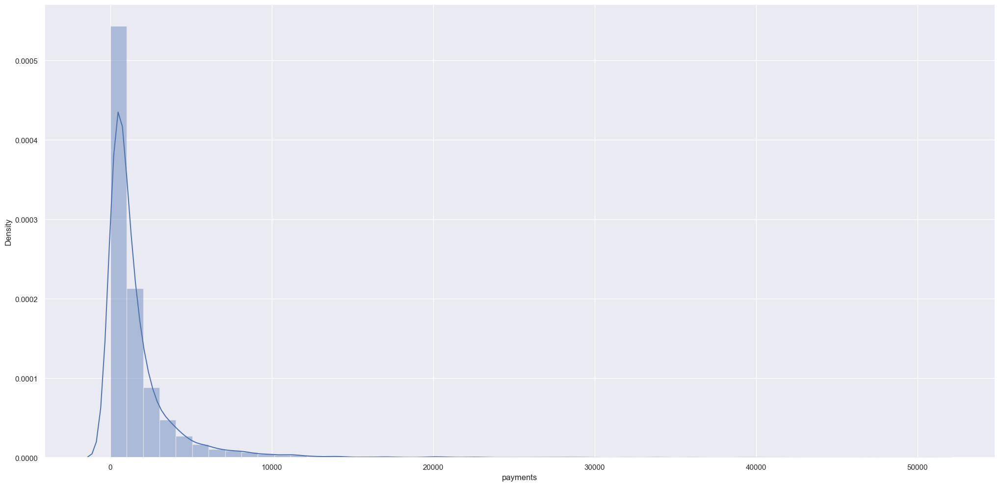

In [34]:
sns.distplot (df4['payments'])

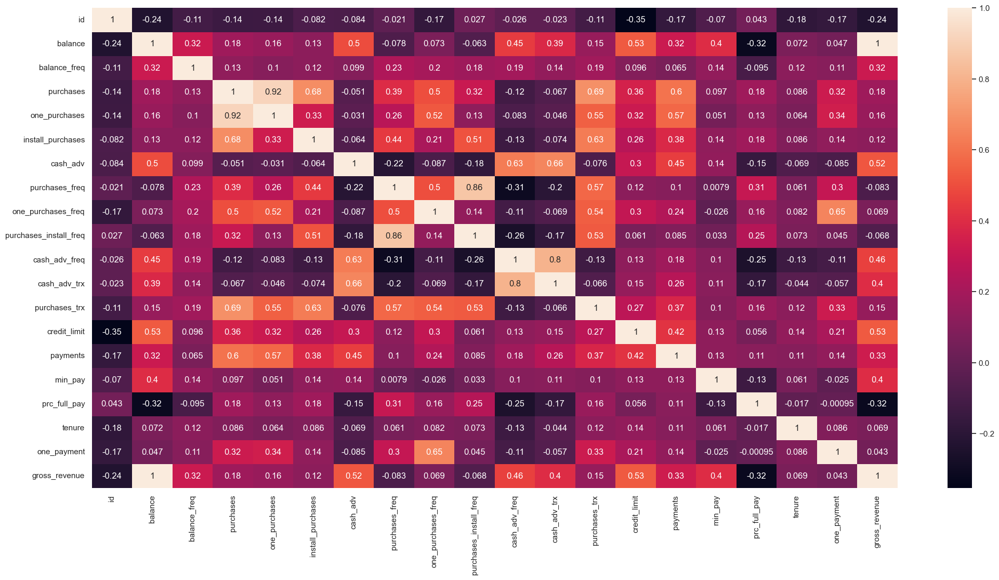

In [35]:
correlation = df4.corr (method = 'pearson')
sns.heatmap (correlation, annot = True);

## 4.2 Bivariate Analysis


In [36]:
cols = ['id']
df42 = df4.drop( cols, axis=1 )
df4 = df4.dropna()

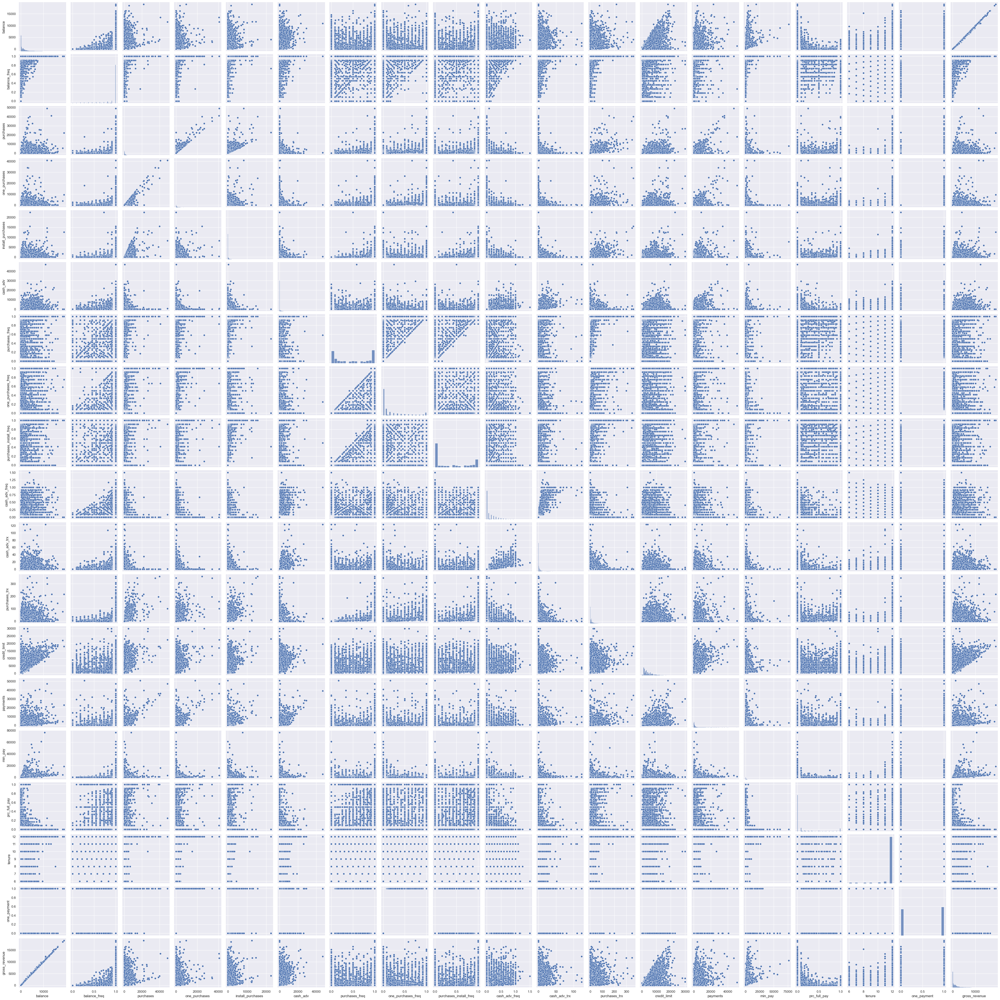

In [37]:
#plt.figure( figsize=(25, 12) )
sns.pairplot( df42)

## 4.3 Outliers Detection


<AxesSubplot: >

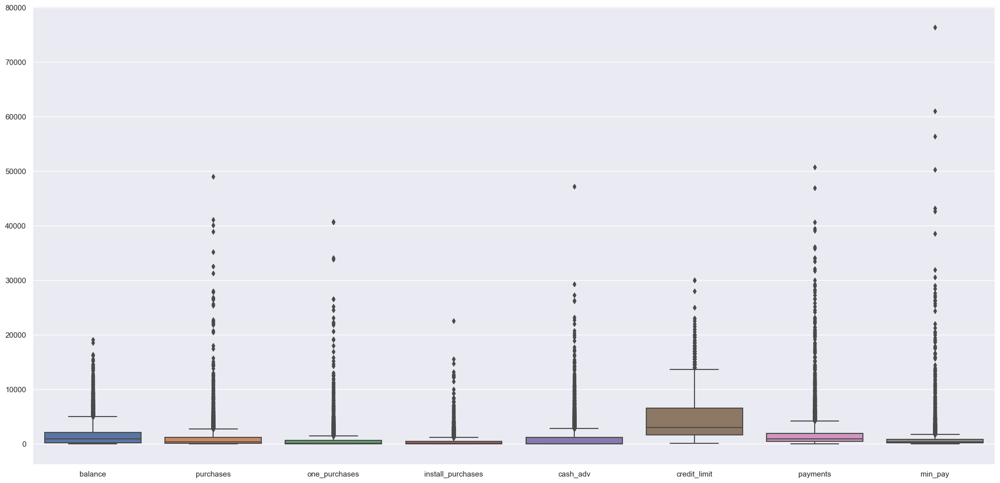

In [38]:

sns.boxplot (df4[['balance', 'purchases', 'one_purchases','install_purchases', 'cash_adv', 'credit_limit', 'payments', 'min_pay']] )

### 4.3.1 Isolation Forest

In [39]:
df41 = df4[['id', 'balance', 'purchases', 'one_purchases','install_purchases', 'cash_adv', 'credit_limit', 'payments', 'min_pay', 'one_payment', 
            'purchases_trx','cash_adv_trx', 'gross_revenue', 'purchases_freq', 'cash_adv_freq' ]]
df41_aux = df41.copy()
#df41 = df4.copy()


In [40]:
anomaly_inputs = df41.copy()
model_IF = en.IsolationForest(contamination=float(0.1),random_state=42)

model_IF.fit(anomaly_inputs)


df41['anomaly_scores'] = model_IF.decision_function( anomaly_inputs )
df41['anomaly'] = model_IF.predict( anomaly_inputs )

# Print out key statistics
print(f"Number of anomalous values {len(df41[df41['anomaly']==-1])}")
print(f"Number of non anomalous values  {len(df41[df41['anomaly']== 1])}")
print(f'Total Number of Values: {len(df41)}')



palette = ['#ff7f0e', '#1f77b4']
#sns.pairplot(df41, vars=anomaly_inputs, hue='anomaly', palette=palette)




Number of anomalous values 895
Number of non anomalous values  8054
Total Number of Values: 8949


### 4.3.2 Clean Outliers

In [41]:

#Remove outliers where 1 represent inliers and -1 represent outliers:
X_train_cleaned = df41[np.where(df41['anomaly'] == 1, True, False)]
X_train_cleaned.shape
#sns.pairplot(X_train_cleaned, vars=anomaly_inputs,palette=palette)

(8054, 17)

# 4.3.3 Outliers

In [42]:
outliers = df41[np.where(df41['anomaly'] == -1, True, False)]

#sns.pairplot(outliers, vars=anomaly_inputs, hue='anomaly', palette=palette)

In [43]:
# 'one_payment',    'purchases_trx', 'purchases_install_freq', 'one_purchases_freq', 'cash_adv_trx'
X_train_cleaned.shape

(8054, 17)

# 5.0 Data Preparation
    - Normal Variable + no outliers = Standard Scaler ( x - mean / std )
    - Normal Variable + outliers    = Robust Scaler ( x - Q1 / ( Q3 - Q1) )
    _ Non Normal Variable           = Min Max Sacler ( x - min / ( max - min ) )

In [206]:
cols_selected = X_train_cleaned.drop(columns=['anomaly', 'anomaly_scores'], axis=1)

df44 = cols_selected.copy()


# 5.1 Clean dataset ( without outliers ) 

In [240]:
# Clean Data

mm = pp.MinMaxScaler()


df44['gross_revenue'] = mm.fit_transform( df44[['gross_revenue']] )
df44['balance'] = mm.fit_transform( df44[['balance']] )
df44['min_pay'] = mm.fit_transform( df44[['min_pay']] )
df44['payments'] = mm.fit_transform( df44[['payments']] )
df44['cash_adv'] = mm.fit_transform( df44[['cash_adv']] )
df44['purchases'] = mm.fit_transform( df44[['purchases']] )
df44['cash_adv_trx'] = mm.fit_transform( df44[['cash_adv_trx']] )
df44['credit_limit'] = mm.fit_transform( df44[['credit_limit']] )
df44['cash_adv_freq'] = mm.fit_transform( df44[['cash_adv_freq']] )
df44['one_purchases'] = mm.fit_transform( df44[['one_purchases']] )
df44['purchases_trx'] = mm.fit_transform( df44[['purchases_trx']] )
df44['purchases_freq'] = mm.fit_transform( df44[['purchases_freq']] )
df44['install_purchases'] = mm.fit_transform( df44[['install_purchases']] )



x = df44.copy()

## 5.2 Dirt Dataset ( with outliers )

In [241]:

mm = pp.MinMaxScaler()

df41_aux['gross_revenue'] = mm.fit_transform( df41_aux[['gross_revenue']] )
df41_aux['balance'] = mm.fit_transform( df41_aux[['balance']] )
df41_aux['min_pay'] = mm.fit_transform( df41_aux[['min_pay']] )
df41_aux['payments'] = mm.fit_transform( df41_aux[['payments']] )
df41_aux['cash_adv'] = mm.fit_transform( df41_aux[['cash_adv']] )
df41_aux['purchases'] = mm.fit_transform( df41_aux[['purchases']] )
df41_aux['cash_adv_trx'] = mm.fit_transform( df41_aux[['cash_adv_trx']] )
df41_aux['credit_limit'] = mm.fit_transform( df41_aux[['credit_limit']] )
df41_aux['cash_adv_freq'] = mm.fit_transform( df41_aux[['cash_adv_freq']] )
df41_aux['one_purchases'] = mm.fit_transform( df41_aux[['one_purchases']] )
df41_aux['purchases_trx'] = mm.fit_transform( df41_aux[['purchases_trx']] )
df41_aux['purchases_freq'] = mm.fit_transform( df41_aux[['purchases_freq']] )
df41_aux['install_purchases'] = mm.fit_transform( df41_aux[['install_purchases']] )

x_aux = df41_aux.copy()

# 6.0 Space Study 

# 6.1 PCA - Clean Dataset

In [242]:
x.shape

(8054, 15)

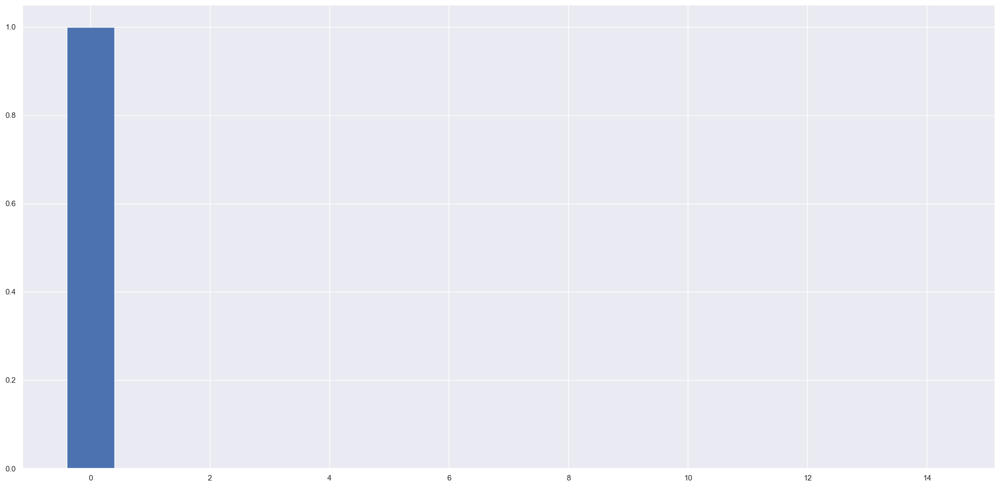

In [243]:
pca = dd.PCA( n_components =  x.shape[1] )

principal_components = pca.fit_transform( x )

# Plot Explaneid Variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_)

# PCA Conponent
df_pca_clean = pd.DataFrame( principal_components )

<AxesSubplot: xlabel='0', ylabel='1'>

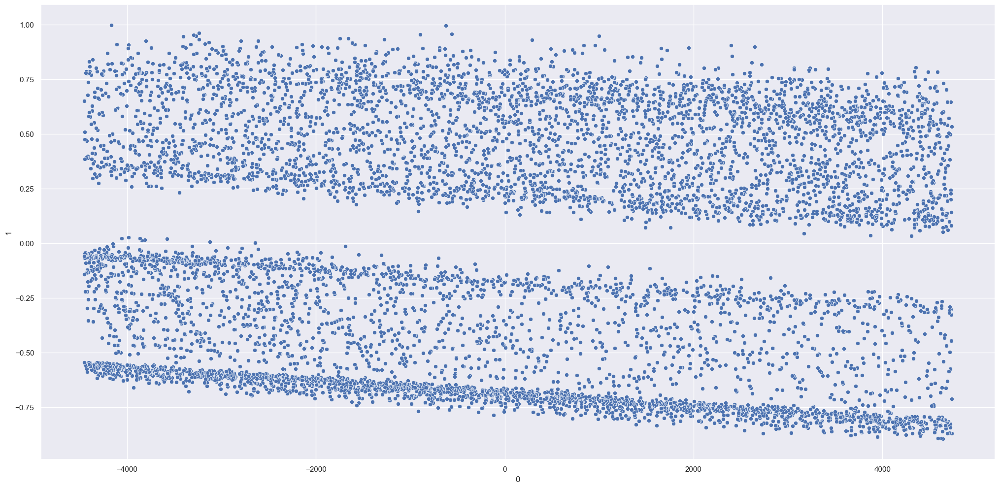

In [244]:
sns.scatterplot( x=0, y=1, data=df_pca_clean )

## 6.2 Dirt Dataset

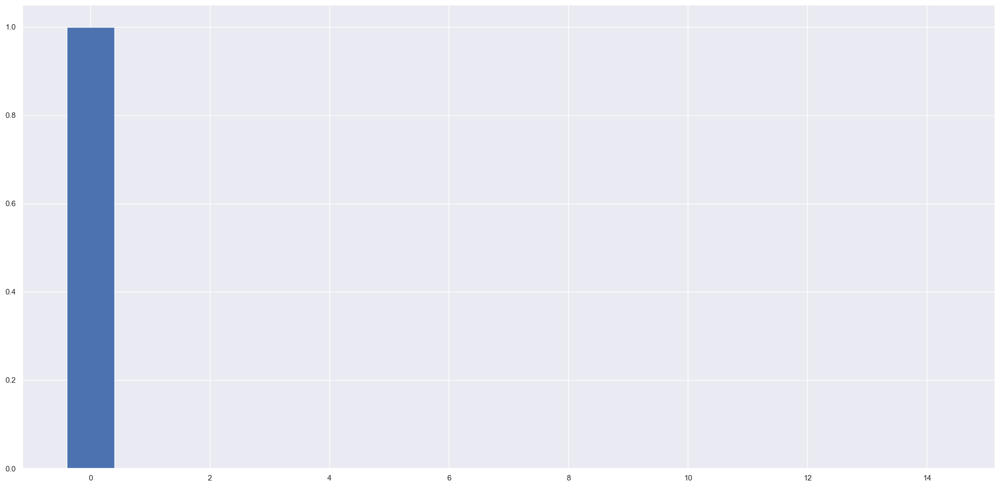

In [245]:
pca = dd.PCA( n_components =  x_aux.shape[1] )

principal_components = pca.fit_transform( x_aux )

# Plot Explaneid Variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_)

# PCA Conponent
df_pca_dirty = pd.DataFrame( principal_components )

<AxesSubplot: xlabel='0', ylabel='1'>

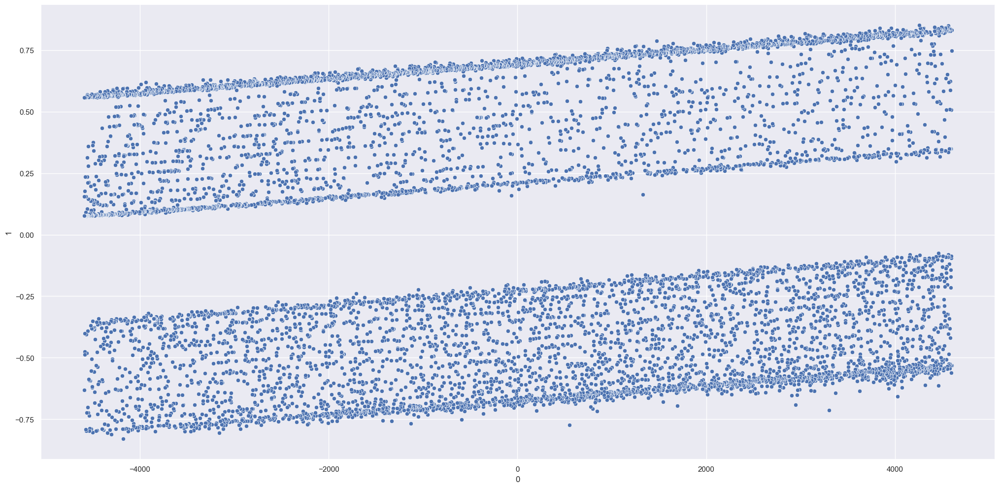

In [246]:
sns.scatterplot( x=0, y=1, data=df_pca_dirty )

## 6.3 Umap Clean

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

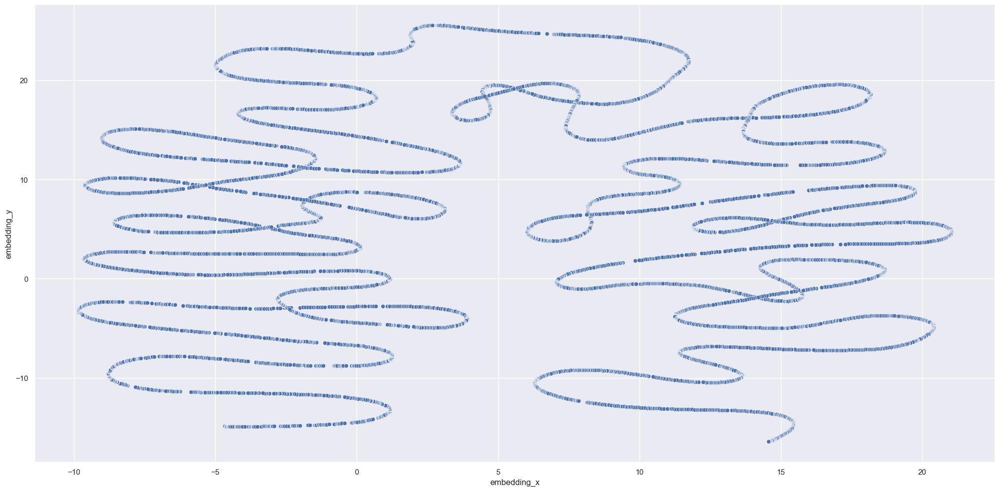

In [247]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( x )

# Embedding
df_pca_clean['embedding_x'] = embedding[:, 0]
df_pca_clean['embedding_y'] = embedding[:, 1]


# Plot UMAP
sns.scatterplot( x='embedding_x',
                 y='embedding_y',
                 data = df_pca_clean )

## 6.3 Dirty Umap

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

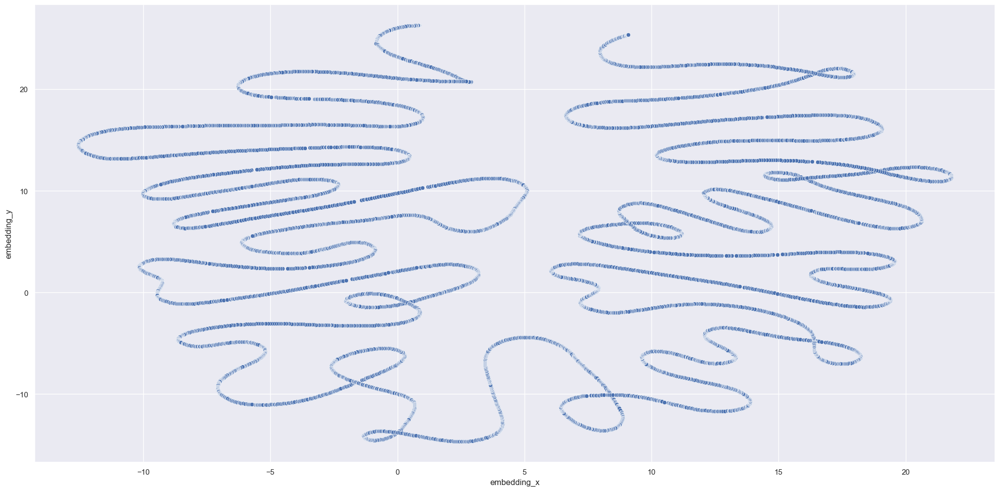

In [248]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( x_aux )

# Embedding
df_pca_dirty['embedding_x'] = embedding[:, 0]
df_pca_dirty['embedding_y'] = embedding[:, 1]


# Plot UMAP
sns.scatterplot( x='embedding_x',
                 y='embedding_y',
                 data = df_pca_dirty )

## 6.4 Clean T-SNE

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

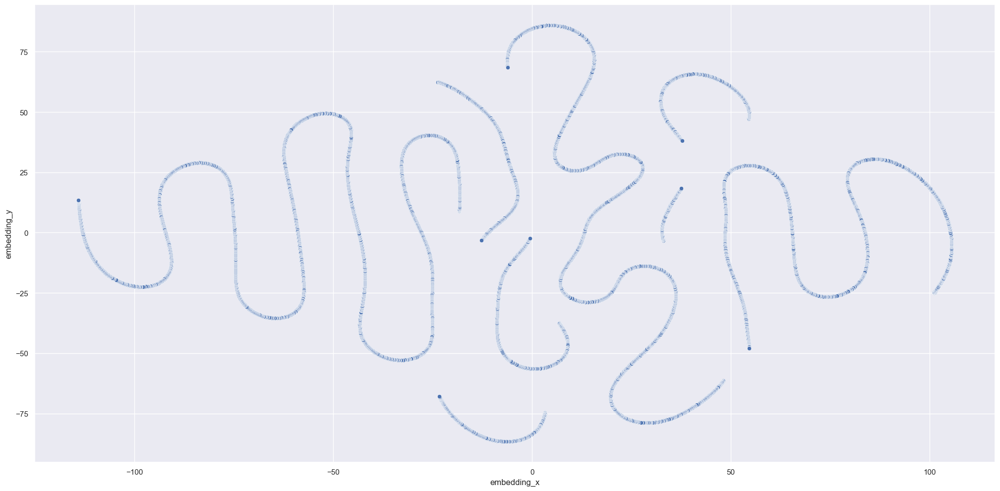

In [250]:
reducer = mn.TSNE( n_components=2, random_state=42, n_jobs =1)

embedding = reducer.fit_transform( x )

df_tsne_clean = pd.DataFrame()

# Embedding
df_tsne_clean['embedding_x'] = embedding[:, 0]
df_tsne_clean['embedding_y'] = embedding[:, 1]


# Plot UMAP
sns.scatterplot( x='embedding_x',
                 y='embedding_y',
                 data = df_tsne_clean )





## 6.4 Dirty TSNE

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

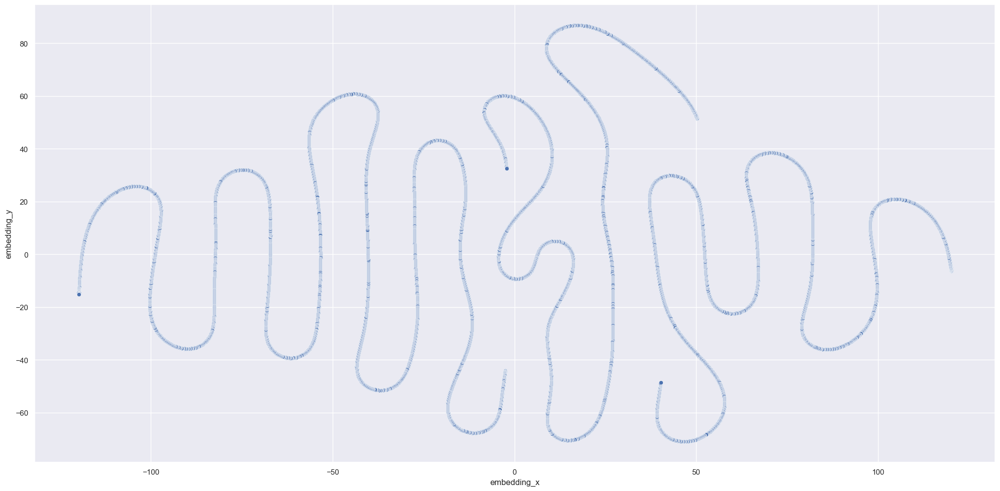

In [251]:
reducer = mn.TSNE( n_components=2, random_state=42, n_jobs =1)

embedding = reducer.fit_transform( x_aux )

df_tsne_dirty = pd.DataFrame()
# Embedding
df_tsne_dirty['embedding_x'] = embedding[:, 0]
df_tsne_dirty['embedding_y'] = embedding[:, 1]


# Plot UMAP
sns.scatterplot( x='embedding_x',
                 y='embedding_y',
                 data = df_tsne_dirty )

## 6.5 Clean Tree Based Imbedding

In [230]:
x = df44.drop( columns=[ 'gross_revenue' ], axis=1)
y = df44['gross_revenue']

# model definition
rf_model = en.RandomForestRegressor( n_estimators=100, random_state=42 )

# Model training
rf_model.fit( x, y )


# dataframe Leaf
df_leaf= pd.DataFrame( rf_model.apply( x ) )

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

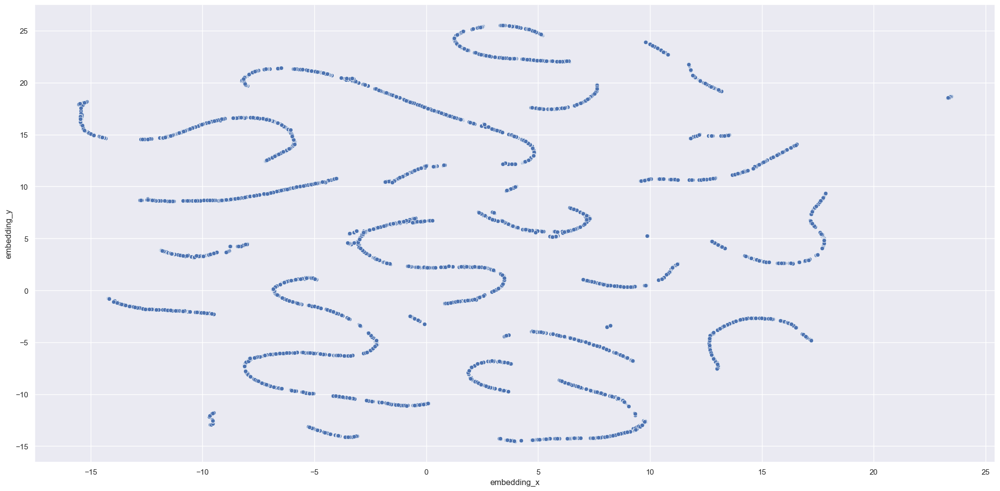

In [231]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( df_leaf )


# Embedding
df_tree = pd.DataFrame()
df_tree['embedding_x'] = embedding[:, 0]
df_tree['embedding_y'] = embedding[:, 1]


# Plot UMAP
sns.scatterplot( x='embedding_x',
                 y='embedding_y',
                 data = df_tree )

## 6.5 Dirty Tree Based Imbedding 

In [232]:
x_D = df41_aux.drop( columns=[ 'gross_revenue' ], axis=1)
y_D= df41_aux['gross_revenue']

# model definition
rf_model = en.RandomForestRegressor( n_estimators=100, random_state=42 )

# Model training
rf_model.fit( x_D, y_D )


# dataframe Leaf
df_leaf= pd.DataFrame( rf_model.apply( x_D ) )

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

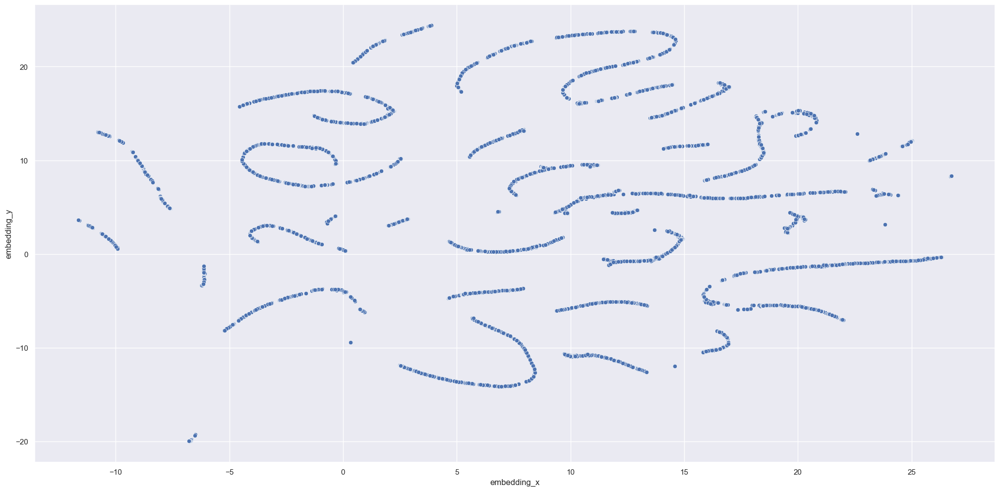

In [233]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( df_leaf )


# Embedding
df_tree_aux = pd.DataFrame()
df_tree_aux['embedding_x'] = embedding[:, 0]
df_tree_aux['embedding_y'] = embedding[:, 1]


# Plot UMAP
sns.scatterplot( x='embedding_x',
                 y='embedding_y',
                 data = df_tree_aux )

# 7.0 Fine Tunning Hyperparameter

In [150]:
#df7 = df_pca.copy()
#df5 = df_tree.copy()
#df5 = df_tree_aux.copy()

In [311]:
x = df_tree.copy()

x_aux = df_tree_aux.copy()

x.head()

# x = df_tsne_clean.copy()

# x_aux = df_tsne_dirty.copy()

# x.head()

,embedding_x,embedding_y
0,5.955133,-14.255415
1,7.092253,18.272326
2,-0.663038,18.106100
3,-9.038713,16.528912
4,-3.377858,5.476316


## 7.1 KMeans Clean

In [312]:
clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]

silhouette_list = []
davies_list = []

for k in clusters:
    # modeldefinition
    kmeans_model = c.KMeans( n_init=10, n_clusters=k )
    
    # model training
    kmeans_model.fit( x )
    
    # Model predict 
    labels =  kmeans_model.predict( x )
    
    # model performance
    sil = m.silhouette_score( x, labels )
    dav = m.davies_bouldin_score( x, labels )
    
    
    silhouette_list.append( sil)
    davies_list.append( dav )


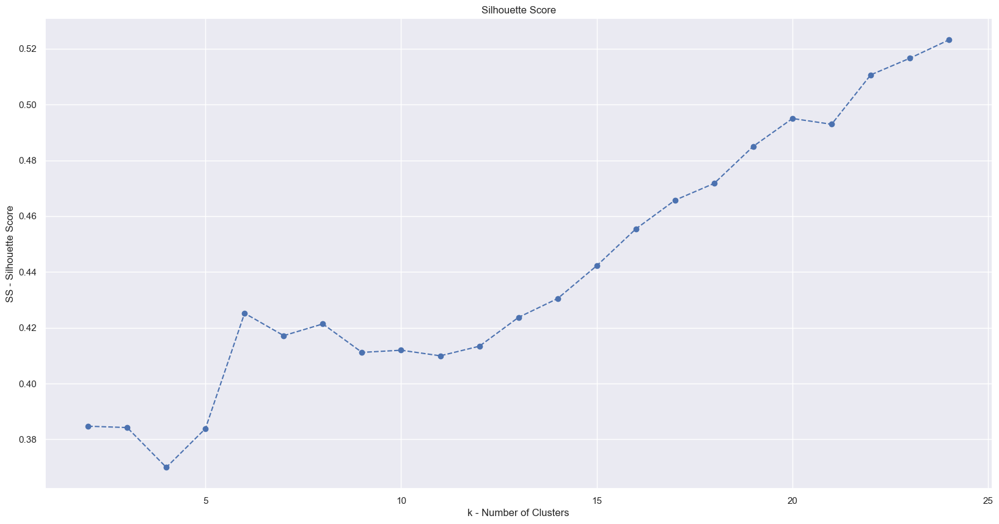

In [313]:
plt.figure( figsize=( 20, 10))
plt.plot( clusters, silhouette_list, linestyle='--', marker='o', color='b')
plt.xlabel( 'k - Number of Clusters' )
plt.ylabel( 'SS - Silhouette Score' )
plt.title('Silhouette Score');

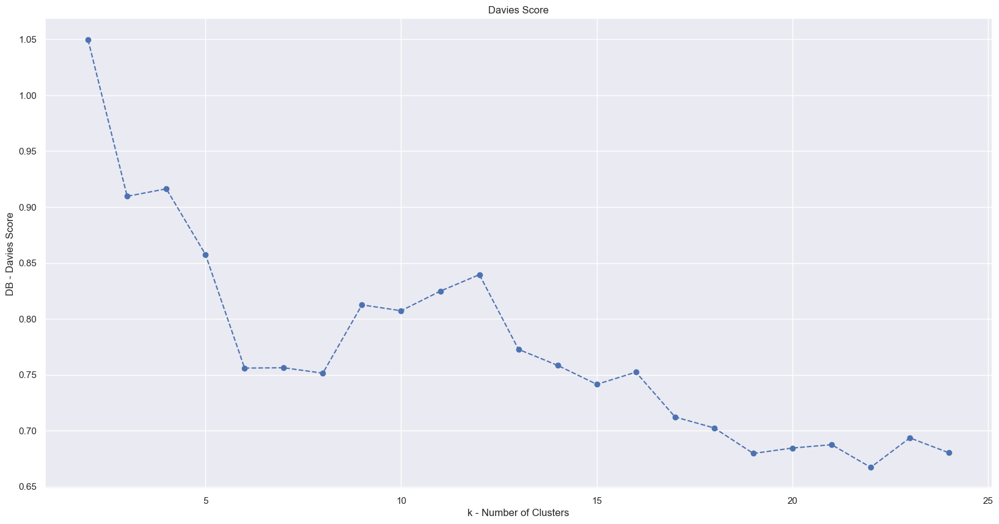

In [314]:
plt.figure( figsize=( 20, 10))
plt.plot( clusters, davies_list, linestyle='--', marker='o', color='b')
plt.xlabel( 'k - Number of Clusters' )
plt.ylabel( 'DB - Davies Score' )
plt.title('Davies Score');

### 7.1.2 KMeans Dirt

In [315]:
clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]

silhouette_list_D = []
davies_list_D = []

for k in clusters:
    # modeldefinition
    kmeans_model_D = c.KMeans( n_init=10, n_clusters=k )
    
    # model training
    kmeans_model_D.fit( x_aux )
    
    # Model predict 
    labels =  kmeans_model_D.predict( x_aux )
    
    # model performance
    sil = m.silhouette_score( x_aux, labels )
    dav = m.davies_bouldin_score( x_aux, labels )
    
    
    silhouette_list_D.append( sil)
    davies_list_D.append( dav )

## 7.2 GMM Clean

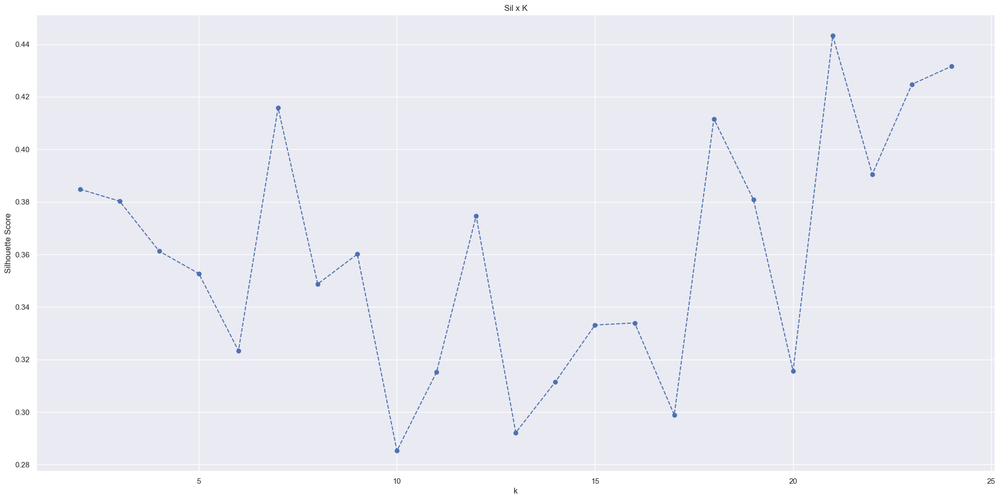

In [316]:
gmm_list = []
for k in clusters:
    # Model definition
    gmm_model = mx.GaussianMixture( n_components=k )

    # Model training
    gmm_model.fit( x )

    # Model  predict
    labels = gmm_model.predict( x )

    # Model performance
    sil = m.silhouette_score( x, labels, metric='euclidean')
    gmm_list.append( sil )
    
    
    
plt.plot( clusters, gmm_list, linestyle='--', marker='o', color='b')  
plt.xlabel( 'k');
plt.ylabel( 'Silhouette Score' );
plt.title( 'Sil x K');

### 7.2.1 GMM Dirt

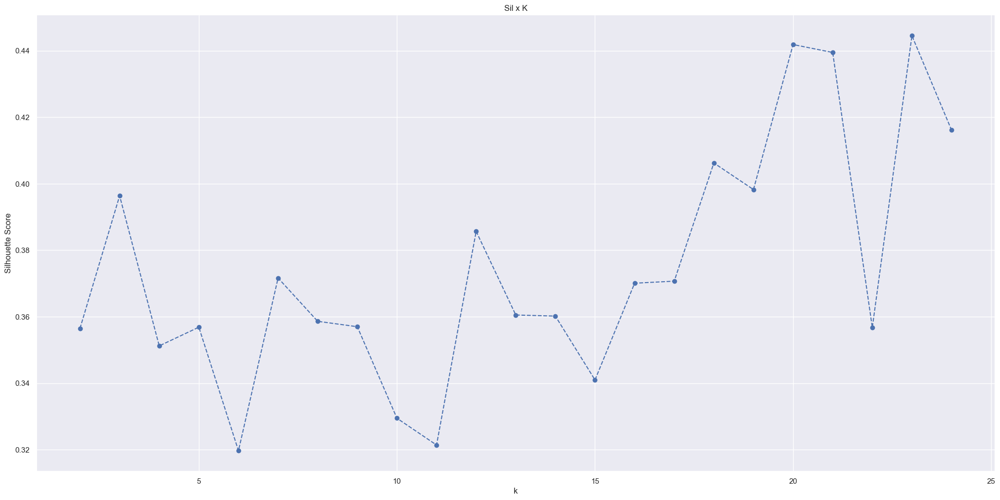

In [317]:
gmm_list_D = []
for k in clusters:
    # Model definition
    gmm_model_D = mx.GaussianMixture( n_components=k )

    # Model training
    gmm_model_D.fit( x_aux )

    # Model  predict
    labels = gmm_model_D.predict( x_aux )

    # Model performance
    sil = m.silhouette_score( x_aux, labels, metric='euclidean')
    gmm_list_D.append( sil )
    
    
plt.plot( clusters, gmm_list_D, linestyle='--', marker='o', color='b')  
plt.xlabel( 'k');
plt.ylabel( 'Silhouette Score' );
plt.title( 'Sil x K');

## 7.3 DBScan Clean

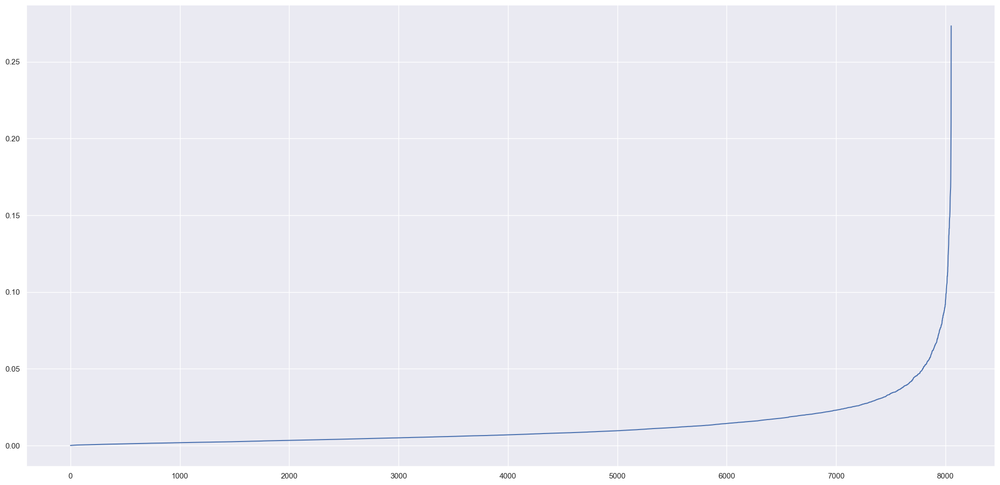

In [349]:
#eps =0.1
eps =0.2
min_samples = 20
dbscan_list = []

for k in clusters:
    # Model definition
    dbscan_model =c.DBSCAN( eps=eps, min_samples=min_samples )

    # Model training
    labels = dbscan_model.fit_predict( x )


    # Model performance
    sil = m.silhouette_score( x, labels, metric='euclidean')
    dbscan_list.append( sil )

    neigbors = NearestNeighbors( n_neighbors=min_samples ).fit( x )
    distances, indices = neigbors.kneighbors( x )
    
    

distances = np.sort( distances, axis=0 )
distances = distances[:, 1]
plt.plot( distances )

## 7.4 Hierarchical Model Clean

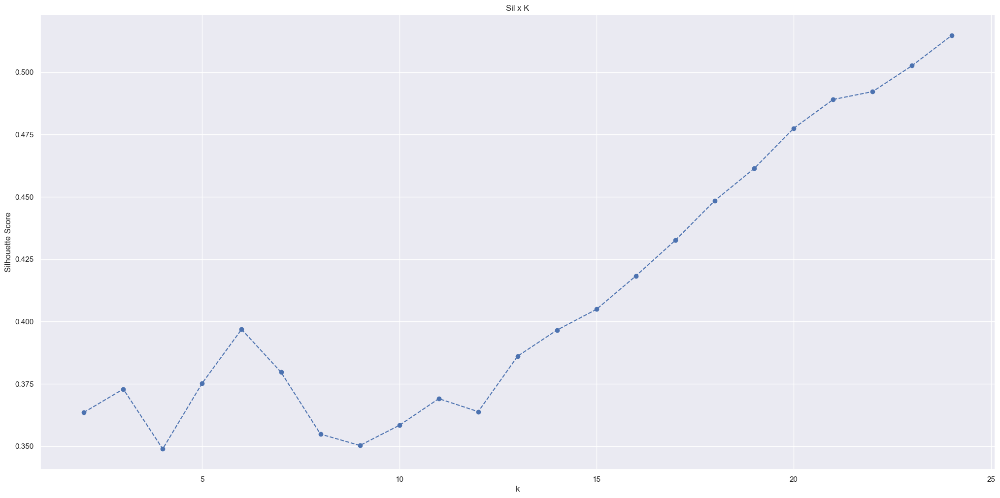

In [320]:
from  scipy.cluster import hierarchy as hc

hc_model = hc.linkage( x, 'ward')
hc_list = []
for k in clusters:
    # Model definition
    hc_model =hc.linkage( x, 'ward' )

    # Model  predict
    labels = hc.fcluster( hc_model, k, criterion='maxclust' )

    # Model performance
    sil = m.silhouette_score( x, labels, metric='euclidean')
    hc_list.append( sil )
    
    
    
plt.plot( clusters, hc_list, linestyle='--', marker='o', color='b')  
plt.xlabel( 'k');
plt.ylabel( 'Silhouette Score' );
plt.title( 'Sil x K');


### 7.4.1 Hierarchical Dirt

In [321]:
from  scipy.cluster import hierarchy as hc

hc_model_D = hc.linkage( x_aux, 'ward')

hc_list_D = []
for k in clusters:
    # Model definition
    hc_model_D =hc.linkage( x_aux, 'ward' )

    # Model  predict
    labels = hc.fcluster( hc_model_D, k, criterion='maxclust' )

    # Model performance
    sil = m.silhouette_score( x_aux, labels, metric='euclidean')
    hc_list_D.append( sil )
    
  

## 7.4 Results

- Kmeans, GMM and HC = Silhouette analysis * the idea is to get as close to 1 as possible.
- Davies - the idea is to get as close to 0 as possible.

In [322]:

df_results = pd.DataFrame({'KMeans': silhouette_list,
                           'Davies': davies_list,
                           'GMM' :gmm_list,
                           'HC':hc_list}
                         
                         ).T

df_results.columns = clusters
df_results.style.highlight_max( color='lightgreen', axis=1)



,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
KMeans,0.384724,0.384239,0.369976,0.383866,0.425207,0.417176,0.421374,0.411175,0.411951,0.409948,0.413386,0.423722,0.430471,0.442238,0.455438,0.465717,0.471734,0.485030,0.494989,0.492914,0.510620,0.516584,0.523168
Davies,1.049528,0.909614,0.916289,0.857669,0.755975,0.756280,0.751438,0.812534,0.807251,0.824758,0.839551,0.772732,0.758409,0.741453,0.752308,0.712272,0.702439,0.679642,0.684486,0.687493,0.667201,0.693558,0.680213
GMM,0.384819,0.380278,0.361230,0.352705,0.323346,0.415827,0.348745,0.360114,0.285290,0.315180,0.374692,0.292194,0.311504,0.333137,0.333942,0.298961,0.411581,0.380846,0.315658,0.443255,0.390553,0.424765,0.431596
HC,0.363559,0.372921,0.348921,0.375267,0.396876,0.379677,0.354853,0.350304,0.358387,0.369077,0.363863,0.386134,0.396619,0.404925,0.418344,0.432629,0.448529,0.461431,0.477520,0.489063,0.492223,0.502627,0.514707


## Results With outliers

In [323]:
# sem Outliers
df_results = pd.DataFrame({'KMeans': silhouette_list_D,
                           'Davies': davies_list_D,
                           'GMM' :gmm_list_D,
                           'HC':hc_list_D}
                         
                         ).T

df_results.columns = clusters
df_results.style.highlight_max( color='lightgreen', axis=1)



### kmeans 2
### Davies 3
### GMM 2

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
KMeans,0.366764,0.395785,0.376207,0.368243,0.391202,0.412890,0.405791,0.401105,0.399405,0.418803,0.403345,0.420167,0.419556,0.435997,0.423167,0.447490,0.433989,0.454561,0.452606,0.465948,0.461295,0.468906,0.485026
Davies,1.121138,0.863722,0.845962,0.862655,0.762592,0.737260,0.809586,0.815830,0.814150,0.788068,0.765702,0.743169,0.745811,0.710400,0.833242,0.736063,0.763662,0.696424,0.721623,0.727636,0.683564,0.711144,0.701880
GMM,0.356499,0.396380,0.351218,0.356847,0.319674,0.371648,0.358615,0.356987,0.329450,0.321392,0.385671,0.360517,0.360180,0.340972,0.370078,0.370698,0.406257,0.398260,0.441893,0.439509,0.356714,0.444555,0.416154
HC,0.317520,0.331963,0.351112,0.343734,0.376128,0.393504,0.399085,0.394511,0.387921,0.398131,0.407060,0.398622,0.409688,0.416024,0.426647,0.436480,0.438737,0.447265,0.451812,0.462349,0.467419,0.476791,0.482867


# 8.0 Machine Learning

In [324]:
df8 = df7.copy()

## 8.1 Final Model

In [333]:
k=8
# modeldefinition
kmeans_model = c.KMeans( n_init=10, n_clusters=k )

# model training
kmeans_model.fit( x )

# Model predict 
labels =  kmeans_model.predict( x )



## 8.2 Cluster Validation

In [334]:
print( 'SS value: {}'.format( m.davies_bouldin_score( x, labels) ) )

SS value: 0.7457387698900967


# 9.0 Clustering Analysis

In [335]:
df9 = x.copy()
df9['cluster'] = labels
df9.head()

,embedding_x,embedding_y,cluster
0,5.955133,-14.255415,2
1,7.092253,18.272326,3
2,-0.663038,18.106100,3
3,-9.038713,16.528912,4
4,-3.377858,5.476316,1


## 9.1 Visualixation Impection 

<AxesSubplot: xlabel='embedding_x', ylabel='embedding_y'>

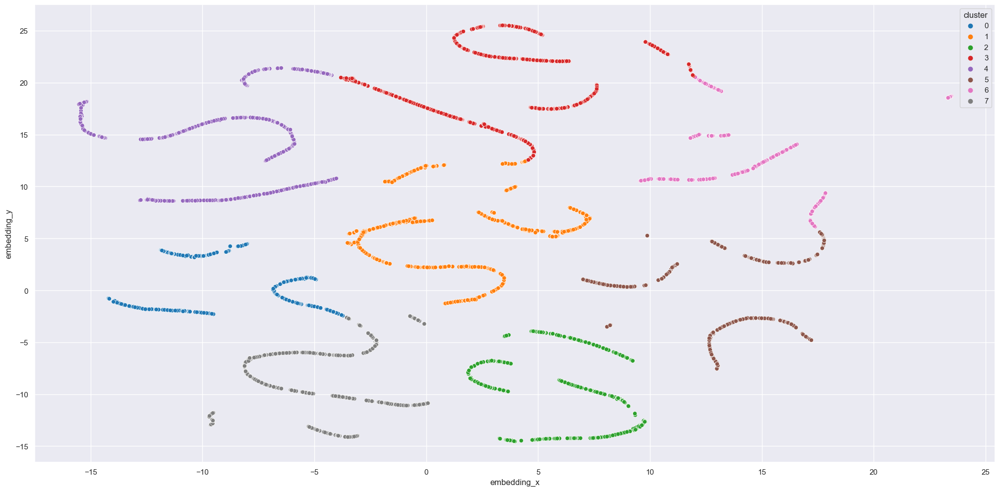

In [336]:
sns.scatterplot( x= 'embedding_x', y='embedding_y', hue='cluster', data=df9, palette='tab10')

## 9.2 Cluster Profile

In [337]:
df92= cols_selected.copy()
df92['cluster'] = labels


In [338]:
# Number of customer
df_cluster = df92[['id', 'cluster']].groupby( 'cluster' ).count().reset_index()
df_cluster['perc_customer'] = 100 * ( df_cluster['id'] / df_cluster['id'].sum() )
df_cluster['perc_customer'] = df_cluster['perc_customer'].map( '{:.2f}%'.format)

# Avg  Balance
df_avg_balance = df92[['balance', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_balance, how='inner', on='cluster' )
df_cluster['balance'] = df_cluster['balance'].map( '${:,.2f}'.format)

# Agv Purchases
df_avg_purchases= df92[['purchases', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_purchases, how='inner', on='cluster' )
df_cluster['purchases'] = df_cluster['purchases'].map( '${:,.2f}'.format)

# Agv One Purchases
df_avg_one_purchases= df92[['one_purchases', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_one_purchases, how='inner', on='cluster' )
df_cluster['one_purchases'] = df_cluster['one_purchases'].map( '${:,.2f}'.format)

# Agv Install Purchases
df_avg_install_purchases= df92[['install_purchases', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_install_purchases, how='inner', on='cluster' )
df_cluster['install_purchases'] = df_cluster['install_purchases'].map( '${:,.2f}'.format)

# Agv Install Purchases TRX
df_avg_install_purchases_trx= df92[['purchases_trx', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_install_purchases_trx, how='inner', on='cluster' )


# Agv Purchase Frequency
df_avg_purchases_freq= df92[['purchases_freq', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_purchases_freq, how='inner', on='cluster' )

# Agv Payments
df_avg_payments= df92[['payments', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_payments, how='inner', on='cluster' )
df_cluster['payments'] = df_cluster['payments'].map( '${:,.2f}'.format)

# Agv Minimum Payments
df_avg_min_pay= df92[['min_pay', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_min_pay, how='inner', on='cluster' )
df_cluster['min_pay'] = df_cluster['min_pay'].map( '${:,.2f}'.format)

# # Agv One Payments
# df_avg_one_payment= df92[['one_payment', 'cluster']].groupby( 'cluster' ).mean().reset_index()
# df_cluster = pd.merge( df_cluster, df_avg_one_payment, how='inner', on='cluster' )
# #df_cluster['one_payment'] = df_cluster['one_payment'].map( '${:,.2f}'.format)

# Agv Credit Limit
df_avg_credit_limit= df92[['credit_limit', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_credit_limit, how='inner', on='cluster' )


# Agv Cash ADV
df_avg_cash_adv= df92[['cash_adv', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_cash_adv, how='inner', on='cluster' )
df_cluster['cash_adv'] = df_cluster['cash_adv'].map( '${:,.2f}'.format)

# Agv Cash ADV TRX
df_avg_cash_adv_trx= df92[['cash_adv_trx', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_cash_adv_trx, how='inner', on='cluster' )

# Agv Cash Advance Frequency
df_avg_cash_adv_freq= df92[['cash_adv_freq', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_cash_adv_freq, how='inner', on='cluster' )


# Agv Gross Revenue
df_avg_gross_revenue= df92[['gross_revenue', 'cluster']].groupby( 'cluster' ).mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_gross_revenue, how='inner', on='cluster' )
df_cluster['gross_revenue'] = df_cluster['gross_revenue'].map( '${:,.2f}'.format)

df_cluster


,cluster,id,perc_customer,balance,purchases,one_purchases,install_purchases,purchases_trx,purchases_freq,payments,min_pay,credit_limit,cash_adv,cash_adv_trx,cash_adv_freq,gross_revenue
0,0,747,9.27%,$595.22,"$1,060.42",$643.14,$417.30,14.340027,0.483614,"$1,460.13",$382.20,3499.843820,$416.91,2.044177,0.104950,$607.72
1,1,1407,17.47%,$913.97,$763.19,$485.23,$278.21,12.407960,0.448722,"$1,291.41",$554.85,2939.489063,$680.52,2.761905,0.133988,$934.39
2,2,868,10.78%,$65.14,$585.42,$225.42,$360.03,11.173963,0.634460,$856.64,$144.07,3953.234243,$84.51,0.330645,0.018981,$67.67
3,3,1230,15.27%,"$3,451.51",$730.89,$485.09,$245.86,11.552033,0.382048,"$1,740.65","$1,337.93",5904.068736,"$1,689.81",4.815447,0.226572,"$3,502.20"
4,4,1423,17.67%,"$1,754.16",$648.85,$393.93,$255.06,10.747013,0.382194,"$1,364.46",$992.38,3564.405119,$954.50,3.667604,0.173703,"$1,782.79"
5,5,847,10.52%,$145.89,$584.98,$295.60,$290.28,11.291617,0.573747,$859.16,$183.31,3361.609603,$124.45,0.661157,0.033185,$149.62
6,6,643,7.98%,$665.51,$198.40,$69.14,$129.26,5.323484,0.377906,$544.57,$261.18,3773.203733,$298.20,0.844479,0.041169,$674.45
7,7,889,11.04%,$177.27,"$1,062.28",$543.82,$519.09,16.326209,0.618227,"$1,359.32",$200.54,4193.835771,$211.60,0.778403,0.042623,$183.62


# Features Description
- Id = Unique identification code for each customer.

- Balance = How much I have already spent on my credit card (the invoice)
- Purchases = Amount spent in Catao in the last 6 months (the sum of all amounts when the person swiped the card)

- Purchase One Off = Sum of all purchases paid in 1 installment on the card in the last 6 months.

- Installment Purchases = Sum of all purchases paid in more than 1 installment by credit card in the last 6 months.


- Cash Advance = Amount withdrawn from the credit card limit accumulated over the last 6 months.

- Purchase Frequency = A value of 0 and 1 that identifies the customer's purchasing frequency.

-  Cash Advance Frequency = The frequency with the customer makes money withdrawals from your credit card.

-  Cash Advance TRX = Number of withdrawals from credit card accounts.

-  Purchase TRX = The amount of purchases made on the credit card.

-  Credit Limit = The limit value of the customer's credit card.

- Payments = The amount paid in excess of the minimum invoice (not necessarily the total invoice)

         Ex:
        Total invoice = 300

        minimi payment = 2000

        Actual payment = 2500

        Payment = 500


        Minimum Payment = 2000

        total payment = Payment + Minimum Payment = 2500

- Minimum Payments = Minimum amount paid on the invoice.

- Tenure = The length of time the card has been held in months (time during which the person is a bank customer)

# 10.0 EDA - Insight Reports

In [339]:
df10 = df92.copy()

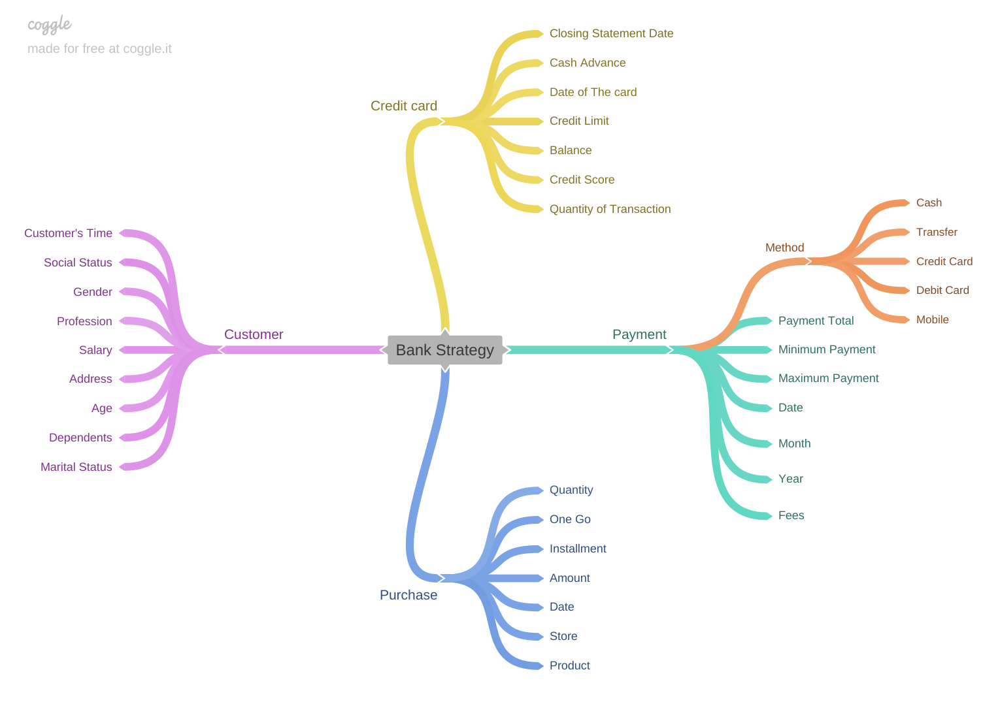

In [340]:
Image( '/Users/adriele/Documents/repos/pa006/image/mind_map.png' )


Customer Hypothesis
- 1. Customers that has a salary over 8k pays the total balance.
- 2. 60% of database are women.
- 3. Single customer buy more.
- 4. Customer the pays the minimum payment are customer under 21 years old.


Credit Card Hypothesis
- 1. The customer pays the full balance for the  credit card that has closing date after day 5 of each month.
- 2. Customer over 40 years old has more transaction on the card.
- 3. Customer who has more balance is who purchase more products.
- 4. who often get the cash advance pays the minimum payment.
- 5. 90% of customers using the credit card.
- 6. 30% of Customers just use card to borrow cash.

Payments Hypothesis
- 1.  who pays the credit card by mobile pays the full balance.
- 2. Customers who has the maximum payments are who has credit limit over 5k.
- 3. Customers that does the full payment are customers who has a credit score over 800points.
- 4. 30% 30% of customers from database buying in installment method.




Purchase Hypothesis
- 1. Customers who has over than 5 dependents has purchases by installment.
- 2. Customer who has pays one go are who doesn't pays the minimum payment.
- 3. 20% of Customers pays the purchases in installment.
- 4. 10% of cutomers takes the cash advance

### H1.0 Customer who has more balance is who purchase more products.

False - The purchase is lower than balance, probably it is accumulated from others months

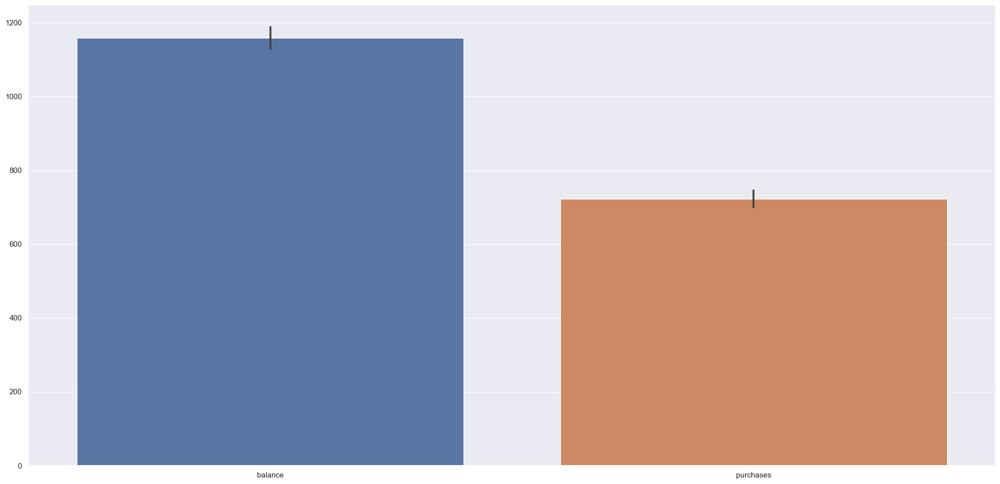

In [341]:
a = df10[['balance', 'purchases']].groupby('balance').sum().reset_index()
sns.barplot ( a );

### H2.0 Customer who often get the cash advance pays the minimum payment.
True 

<AxesSubplot: ylabel='Count'>

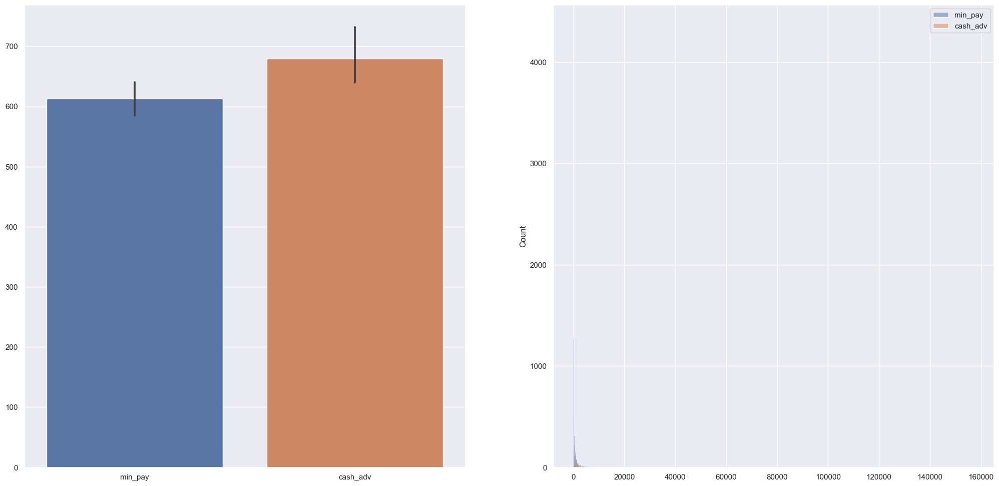

In [342]:
h2 = df10[['cash_adv', 'min_pay']].groupby('min_pay').sum().reset_index()
plt.subplot (1, 2, 1)
sns.barplot( h2 )

plt.subplot (1, 2, 2)
sns.histplot ( h2 )



### H3. 90% of customers using the credit card.
False - Just 76.29% Are using the credit card.

In [343]:

h3 = len(df10[df10['purchases_trx']==0])
h33 = len(df10[df10['purchases_trx']>=1])
total_customers = len( df10 )

print(f"Custumers not Using the credit Card {len(df10[df10['purchases_trx']==0])}")
print(f"Custumers Using the credit Card  {len(df10[df10['purchases_trx']>=1])}")
print( '% of Custumer USING the Credit Card: {: .2f}%'.format(  100 * h33 / total_customers ) ) 
print( '% of Custumer NOT Using the Credit Card: {: .2f}%'.format(  100 * h3 / total_customers ) ) 



Custumers not Using the credit Card 1875
Custumers Using the credit Card  6179
% of Custumer USING the Credit Card:  76.72%
% of Custumer NOT Using the Credit Card:  23.28%


### h4. 30% of customers from database buying in installment method.

- False. 54% of custumers are buying on Intalmente method.

In [344]:
h4 = len(df10[df10['one_purchases']>=1])
h44 = len(df10[df10['install_purchases']>=1])
total_customers = len( df10 )

print( '% of Custumer buying One Go: {: .2f}%'.format(  100 * h4 / total_customers ) ) 
print( '% of Custumerbuying Installment: {: .2f}%'.format(  100 * h44 / total_customers ) ) 




selected_cols = ['one_purchases', 'install_purchases']
cluster_data = df10.loc[:, selected_cols]


# def distributions(df10):
#     fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8,8))
#     sns.distplot(df10["one_purchases"], ax=ax1)
#     sns.distplot(df10["install_purchases"], ax=ax2)
#     plt.tight_layout()
    
    
    
    
#distributions(cluster_data)

% of Custumer buying One Go:  50.20%
% of Custumerbuying Installment:  55.14%


### H5 - 10% of cutomers takes the cash advance.
False - 46.95% of Customers are taking the cash adv.

In [345]:
h3 = len(df10[df10['cash_adv']==0])
h33 = len(df10[df10['cash_adv']>=1])
total_customers = len( df10 )


print(f"Custumers Taking the Cash Advance  {len(df10[df10['cash_adv']>=1])}")
print(f"Custumers NOT Taking the Cash Advance {len(df10[df10['cash_adv']==0])}")
print( '% of Custumer Taking the Cash Advance: {: .2f}%'.format(  100 * h33 / total_customers ) ) 
print( '% of Custumer NOT Taking the Cash Advance: {: .2f}%'.format(  100 * h3 / total_customers ) ) 



Custumers Taking the Cash Advance  3663
Custumers NOT Taking the Cash Advance 4391
% of Custumer Taking the Cash Advance:  45.48%
% of Custumer NOT Taking the Cash Advance:  54.52%


### H6 - 30% of Customers just use card to borrow cash.
False - 21% use the card to borrow cash

% Custumers just use the card for Borrow Money :  1664.00
% Custumers that Borrow Money and Use for Purchases :  5517.00
% Borrow Money:  20.66%
% Purchase + Borrow Money:  68.50%


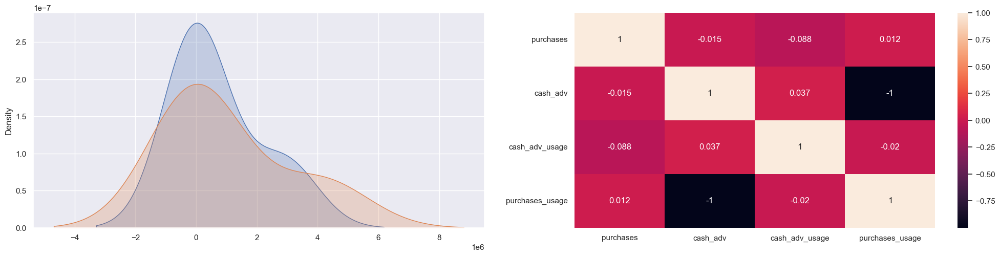

In [346]:

h6 = df10[['purchases', 'cash_adv']].groupby( 'purchases' ).sum().reset_index()
total_customers = len( df10 )
h6['cash_adv_usage'] = h6['cash_adv'].apply( lambda x:  0 if x == 0  else 1)
h6['purchases_usage'] = h6['purchases'].apply( lambda x:  0 if x == 0  else 1)

h = len(h6[h6['cash_adv_usage']==1])
h33 = len(h6[h6['purchases_usage']==1])

plt.subplot( 2, 2, 1 )
sns.kdeplot( h6 [(h6['purchases_usage'] == 0) & (h6['cash_adv_usage'] == 1)].sum(), label='Bow', shade=True )
sns.kdeplot( h6 [(h6['purchases_usage'] == 1) & (h6['cash_adv_usage'] == 0)].sum(), label='Bow', shade=True )

plt.subplot (2, 2, 2)
sns.heatmap( h6.corr (method = 'pearson'), annot = True)

print( '% Custumers just use the card for Borrow Money : {: .2f}'.format( h6['cash_adv'].apply( lambda x:  0 if x == 0  else 1).sum() ) )
print( '% Custumers that Borrow Money and Use for Purchases : {: .2f}'.format( h6['purchases'].apply( lambda x:  0 if x == 0  else 1).sum() ) )
print( '% Borrow Money: {: .2f}%'.format(  100 * h / total_customers ) )
print( '% Purchase + Borrow Money: {: .2f}%'.format(  100 * h33 / total_customers ) ) 


# Model Results

In [347]:

# Percentage Customers
df_return = df92[['id', 'cluster']].groupby( 'cluster' ).count().reset_index()
df_return['perc_customer'] = 100 * ( df_return['id'] / df_return['id'].sum() )
df_return['perc_customer'] = df_return['perc_customer'].map( '{:.2f}%'.format)

# Gross Revenue Total by Cluster
df_gross_revenue= df92[['gross_revenue', 'cluster']].groupby( 'cluster' ).sum().reset_index()
df_return = pd.merge( df_return, df_gross_revenue, how='inner', on='cluster' )
df_return['gross_revenue'] = df_return['gross_revenue'].map( '${:,.2f}'.format)

# Percentage Retun by Cluster
df_return['perc_return'] = 100 * ( df_gross_revenue['gross_revenue'] / df_gross_revenue['gross_revenue'].sum() )
df_return['perc_return'] = df_return['perc_return'].map( '{:.2f}%'.format) 


df_return.head(10)




,cluster,id,perc_customer,gross_revenue,perc_return
0,0,747,9.27%,"$453,969.70",4.83%
1,1,1407,17.47%,"$1,314,680.41",13.99%
2,2,868,10.78%,"$58,741.55",0.63%
3,3,1230,15.27%,"$4,307,709.01",45.85%
4,4,1423,17.67%,"$2,536,915.47",27.00%
5,5,847,10.52%,"$126,727.63",1.35%
6,6,643,7.98%,"$433,672.47",4.62%
7,7,889,11.04%,"$163,240.08",1.74%
